In [1]:

import json
import requests
import re
import imageio
from skimage import transform,io,data
from skimage.viewer import ImageViewer
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sb
import datetime


D:\anaconda\lib\site-packages\skimage\viewer\utils\__init__.py:1: UserWarning: Recommended matplotlib backend is `Agg` for full skimage.viewer functionality.
  from .core import *


In [2]:
#some definitions of parameters
apikey='DEMO_KEY'
apiurl='https://api.nasa.gov/mars-photos/api/v1/rovers/curiosity/photos'
apiurlm='https://api.nasa.gov/mars-photos/api/v1/manifests/curiosity'
earthdate='2020-08-07'#aaa-mm-dd
camera='all'
page='1'
sb.set(rc={"figure.figsize": (20, 5)})



In [3]:
response = requests.get(apiurlm, params={'api_key':apikey})


In [4]:
a=json.loads(response.text)
print(type(a))
df=pd.DataFrame(a)
df

<class 'dict'>


,photo_manifest
landing_date,2012-08-06
launch_date,2011-11-26
max_date,2021-02-24
max_sol,3041
name,Curiosity
photos,"[{'sol': 0, 'earth_date': '2012-08-06', 'total..."
status,active
total_photos,476318


In [5]:
b=df['photo_manifest']['photos']
pf=pd.DataFrame(b)
pf['earth_datep']=pd.to_datetime(pf['earth_date'])
c=pf.query('earth_datep>="2020-01-01"')
c.sort_values(by=['earth_datep'])

,sol,earth_date,total_photos,cameras,earth_datep
2362,2632,2020-01-01,1099,"[CHEMCAM, FHAZ, MAHLI, MAST, NAVCAM, RHAZ]",2020-01-01
2363,2633,2020-01-02,458,"[FHAZ, MAHLI, MARDI, MAST, NAVCAM, RHAZ]",2020-01-02
2364,2634,2020-01-03,59,"[CHEMCAM, FHAZ, MAST, NAVCAM, RHAZ]",2020-01-03
2365,2635,2020-01-04,371,"[CHEMCAM, FHAZ, MAST, NAVCAM, RHAZ]",2020-01-04
2366,2636,2020-01-05,197,"[CHEMCAM, FHAZ, MARDI, MAST, NAVCAM, RHAZ]",2020-01-05
...,...,...,...,...,...
2748,3037,2021-02-20,201,"[CHEMCAM, FHAZ, MAHLI, MAST, NAVCAM, RHAZ]",2021-02-20
2749,3038,2021-02-21,236,"[CHEMCAM, FHAZ, MAST, NAVCAM, RHAZ]",2021-02-21
2750,3039,2021-02-22,294,"[FHAZ, MAST, NAVCAM, RHAZ]",2021-02-22
2751,3040,2021-02-23,485,"[CHEMCAM, FHAZ, MAHLI, MAST, NAVCAM, RHAZ]",2021-02-23


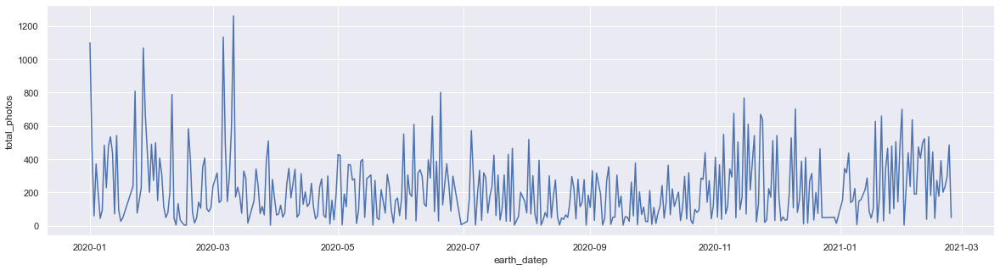

In [6]:
ax = sb.lineplot(x="earth_datep", y="total_photos", 
                  data=c)

In [10]:
earthdate='2020-08-09'
responsep = requests.get(apiurl, params={'earth_date': earthdate,'api_key':apikey})



In [11]:
a=json.loads(responsep.text)
df=pd.DataFrame(a['photos'])
b=df['img_src']

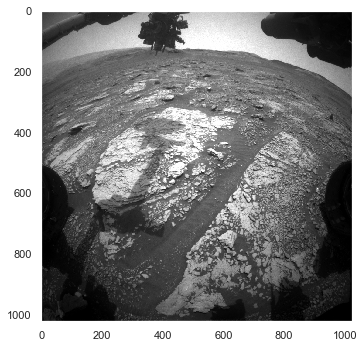

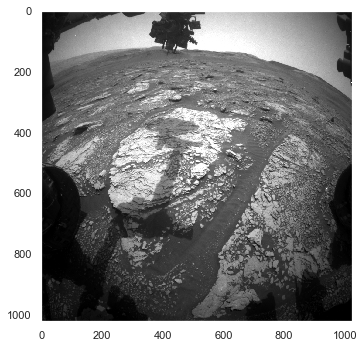

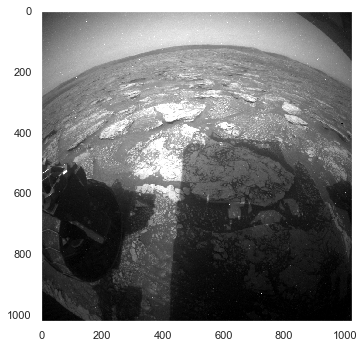

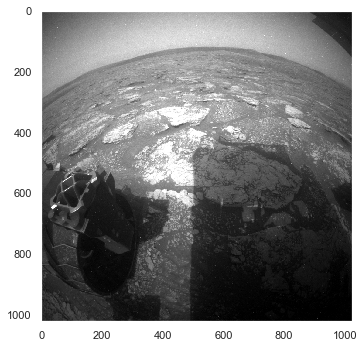

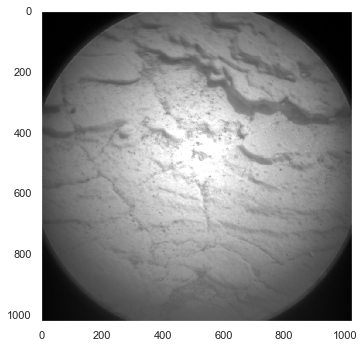

...

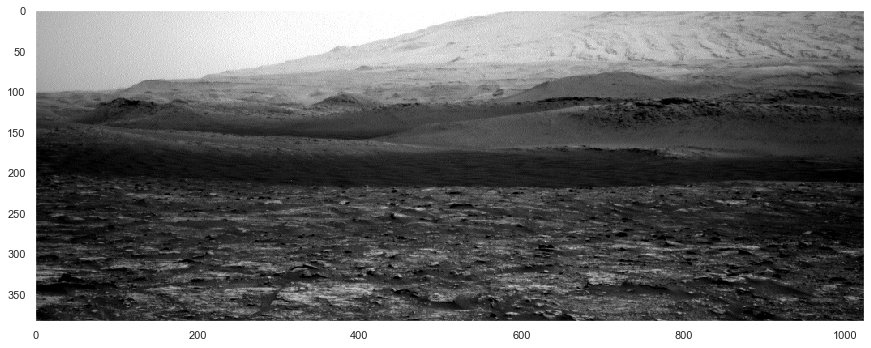

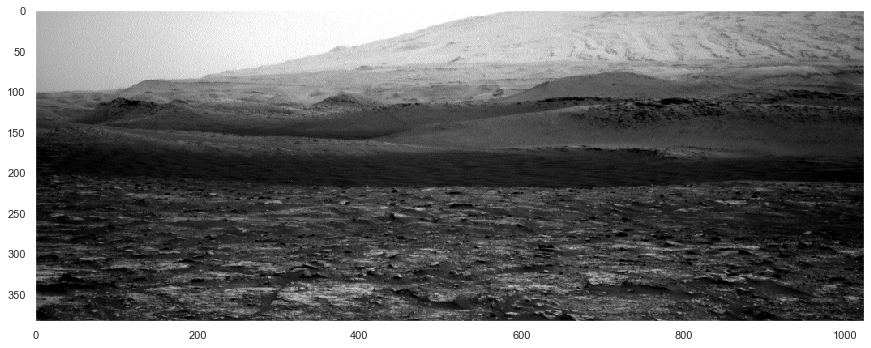

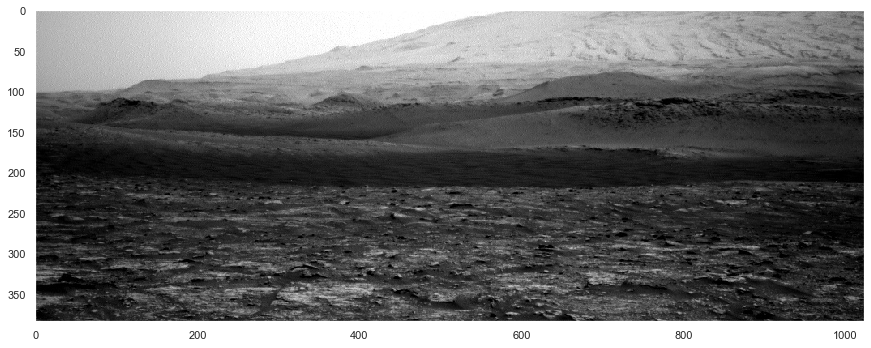

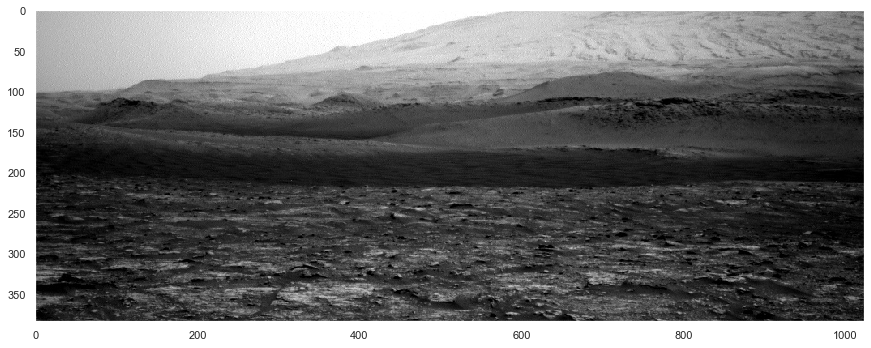

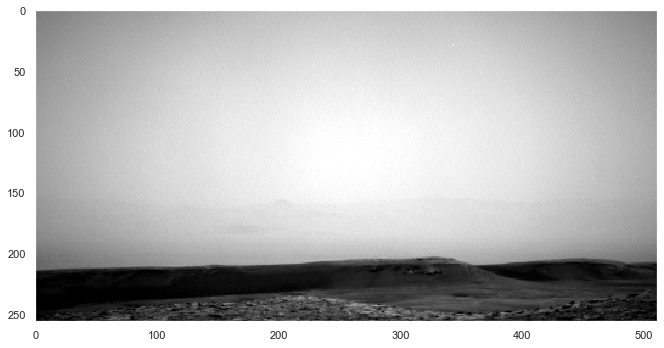

In [9]:
for i in b:
    image = io.imread(i)
    io.imshow(image)
    plt.grid(b=None)
    io.show()

    